In [ ]:
import cv2
import numpy as np
import os
import glob

In [ ]:
import numpy as np
import cv2
import glob

chessboard_size = (9, 7)

objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)*2
objpoints = []
imgpoints = []
image_folder = '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/*.jpg'
images = glob.glob(image_folder)
images.sort()
print(images)

['/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img1.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img10.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img11.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img12.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img13.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img14.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img15.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img16.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img17.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img18.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img19.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img2.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img20.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img21.jpg', '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img23.jp

1. Report the estimated intrinsic camera parameters, i.e., focal length(s), skew parameter and principal point

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img1.jpg


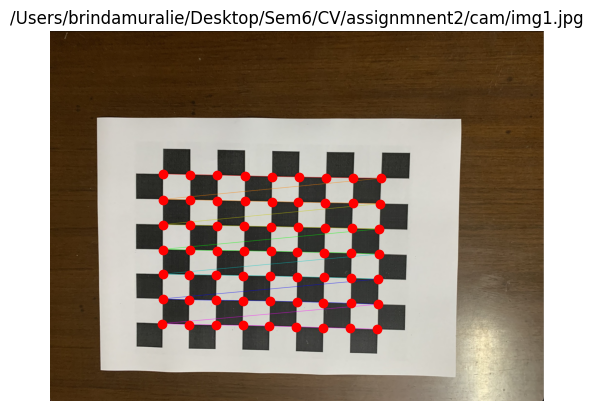

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img10.jpg


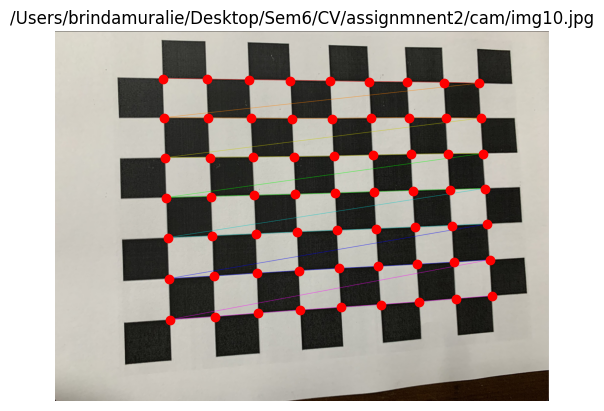

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img11.jpg


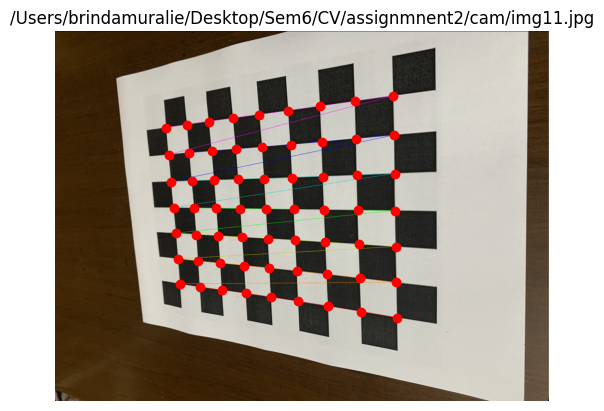

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img12.jpg


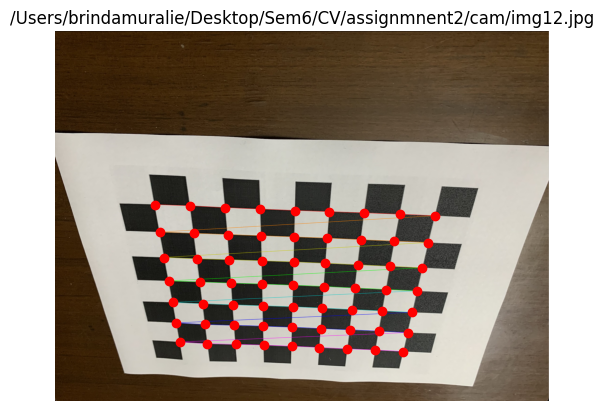

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img13.jpg


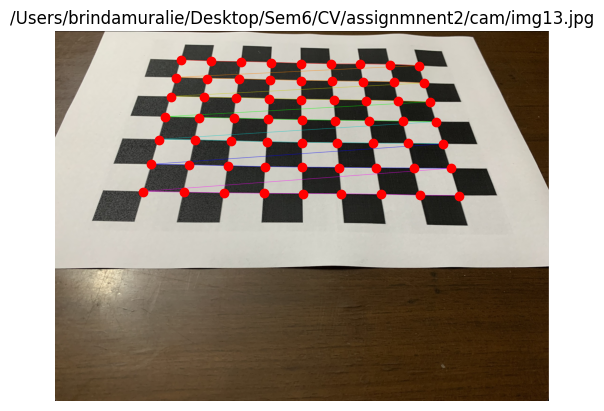

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img14.jpg


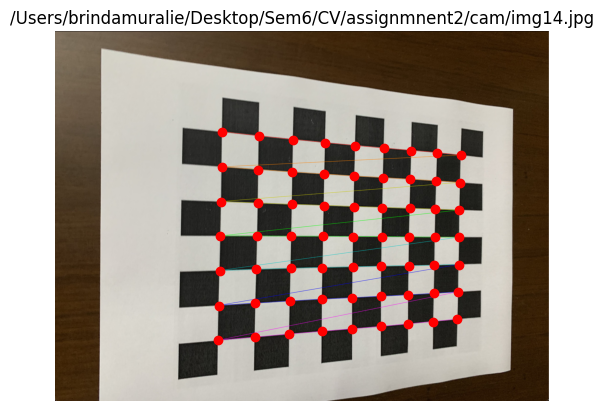

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img15.jpg


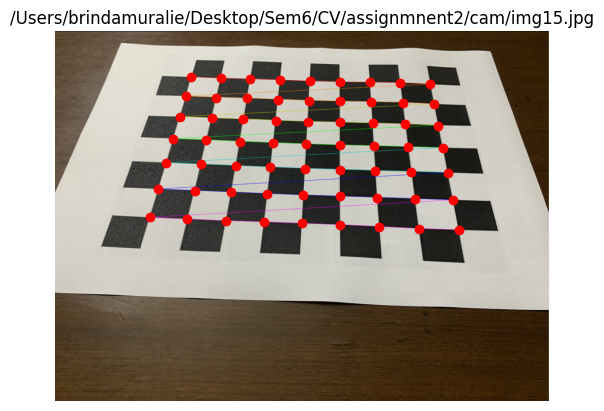

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img16.jpg


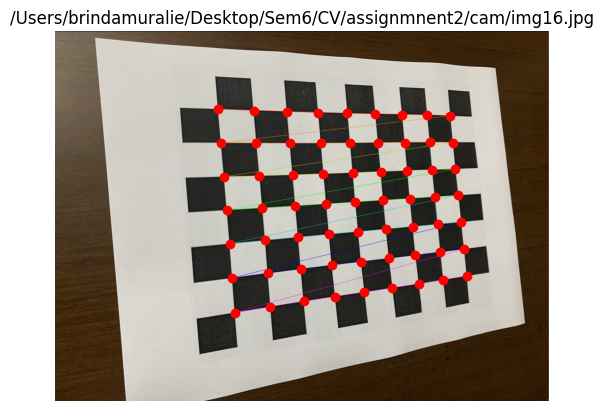

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img17.jpg


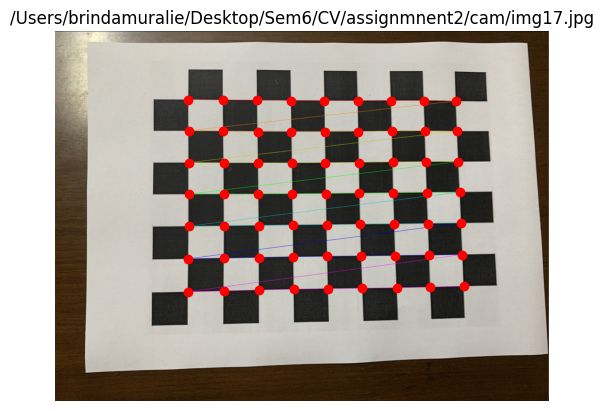

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img18.jpg


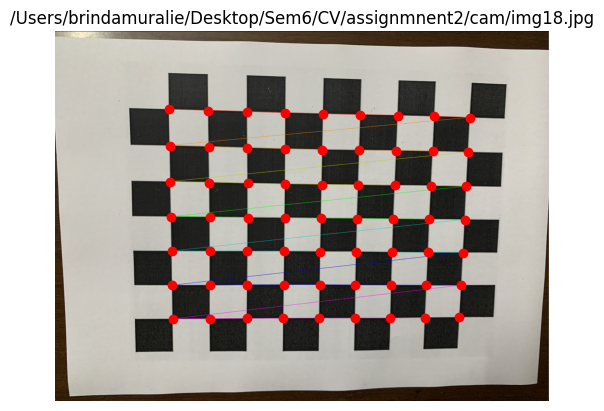

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img19.jpg


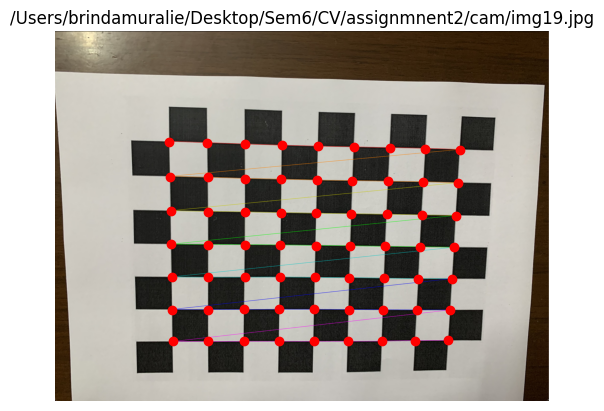

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img2.jpg


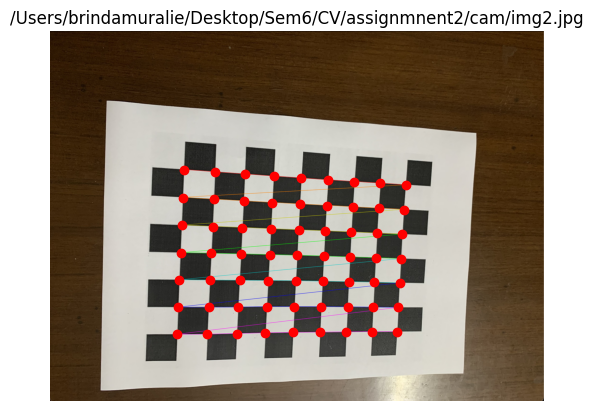

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img20.jpg


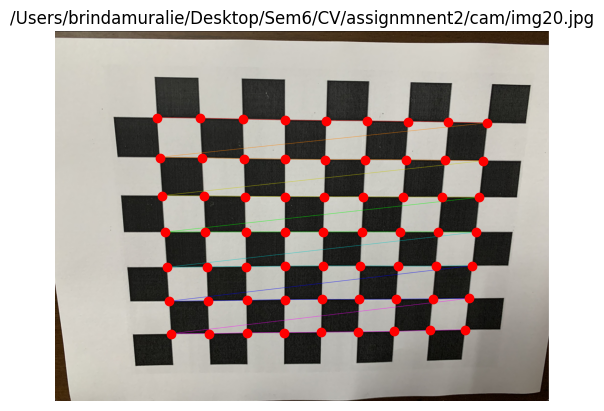

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img21.jpg


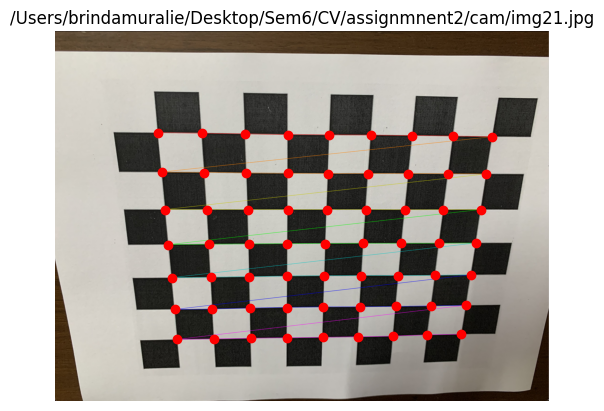

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img23.jpg


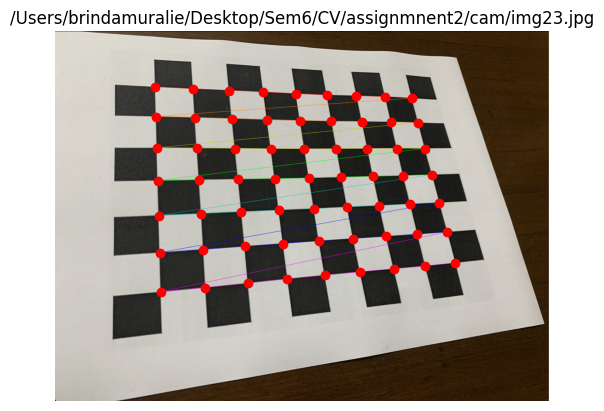

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img24.jpg


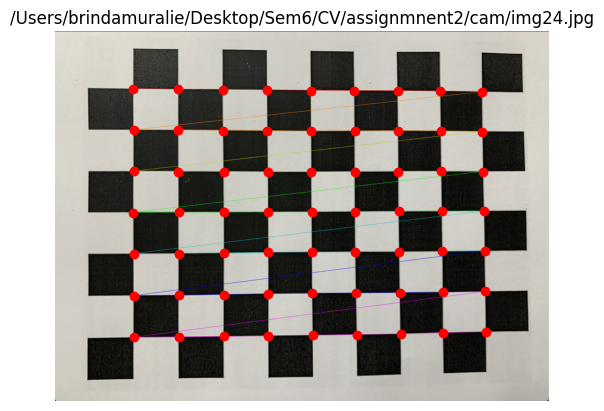

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img25.jpg


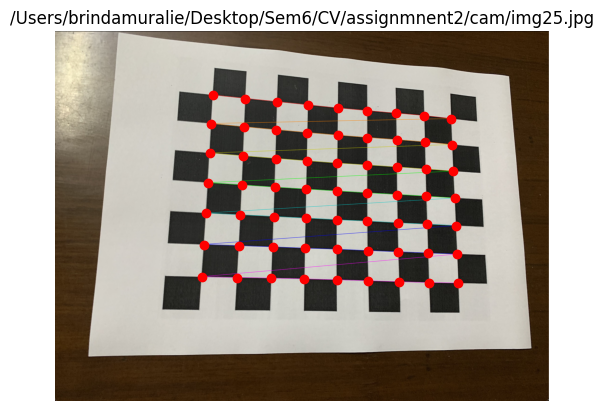

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img3.jpg


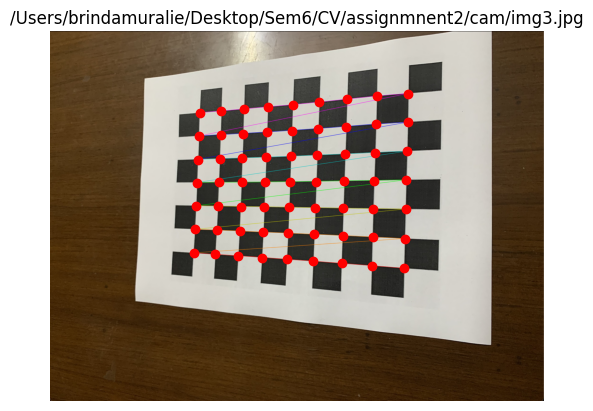

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img4.jpg


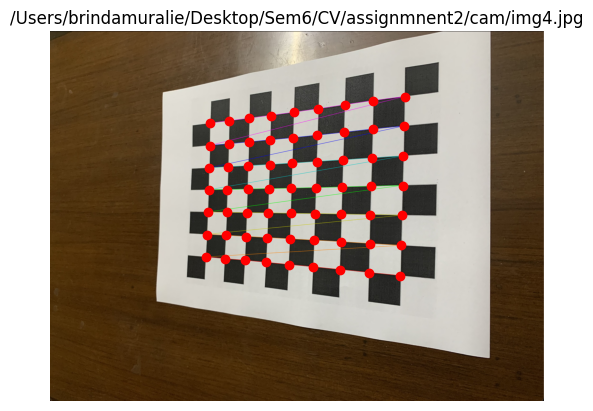

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img5.jpg


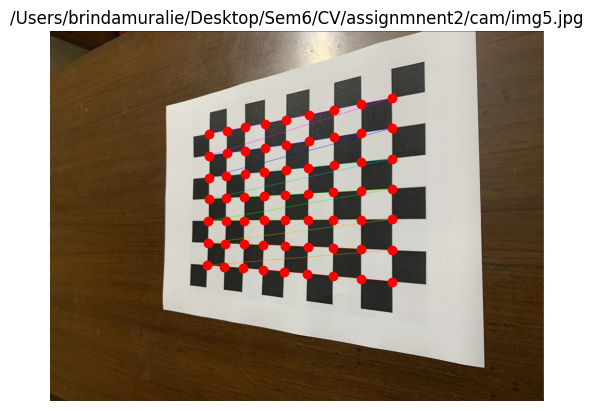

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img6.jpg


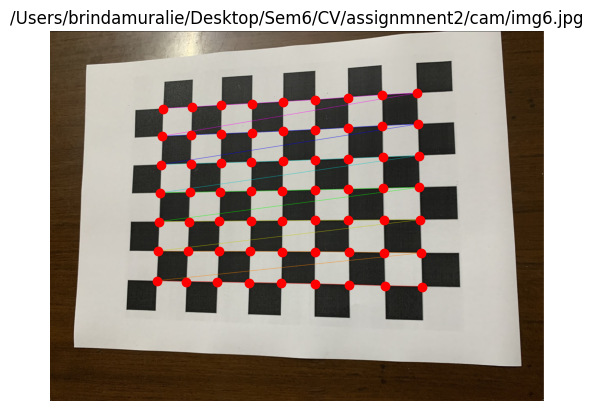

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img7.jpg


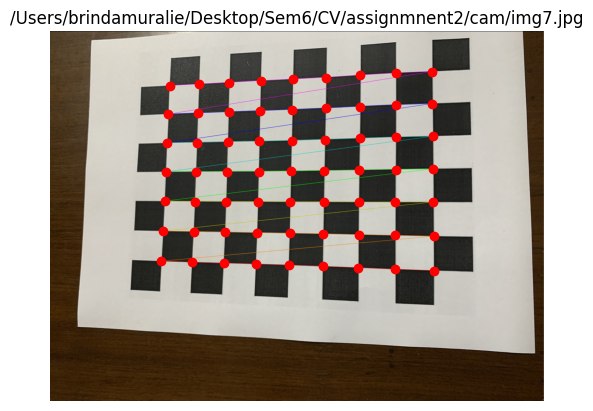

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img8.jpg


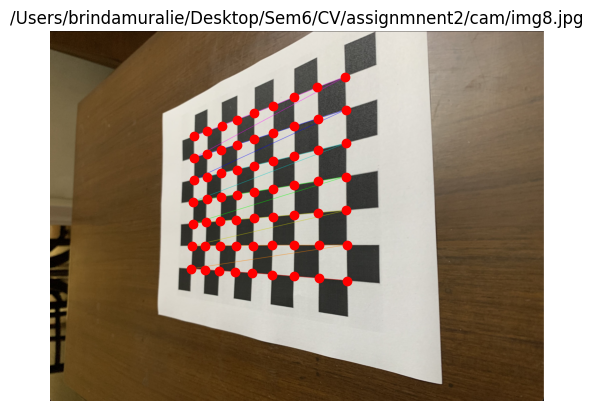

/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img9.jpg


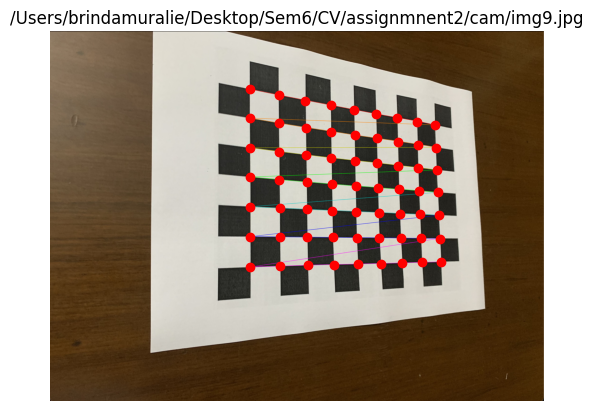

Intrinsic Parameters:
Focal Length (fx, fy): 1630.2288586181894 1508.6259921130938
Principal Point (cx, cy): 1040.780038644784 780.8043820137913
Skew Parameter: 0.0


In [ ]:
import matplotlib.pyplot as plt

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)
    if ret:
        print(fname)
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        imgpoints.append(corners2)
        img = cv2.drawChessboardCorners(img, chessboard_size, corners2, ret)
        plt.figure()
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.plot(corners2[:, 0, 0], corners2[:, 0, 1], 'ro')
        plt.title(fname)
        plt.axis('off')
        plt.show()

cv2.destroyAllWindows()

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print("Intrinsic Parameters:")
print("Focal Length (fx, fy):", mtx[0, 0], mtx[1, 1])
print("Principal Point (cx, cy):", mtx[0, 2], mtx[1, 2])
print("Skew Parameter:", mtx[0, 1])

2. Report the estimated extrinsic camera parameters, i.e., rotation matrix and translation vector for each of the selected images.

In [ ]:
print("\nExtrinsic Parameters:")
for i in range(len(rvecs)):
    rmat, _ = cv2.Rodrigues(rvecs[i])
    print("Image:", images[i])
    print("Rotation Matrix:")
    print(rmat)
    print("Translation Vector:")
    print(tvecs[i])
    print("="*20)


Extrinsic Parameters:
Image: /Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img1.jpg
Rotation Matrix:
[[ 0.99936379 -0.01840632  0.03054862]
 [ 0.01964017  0.99898269 -0.04059365]
 [-0.02977036  0.0411678   0.99870863]]
Translation Vector:
[[-9.70163044]
 [-3.23710247]
 [28.75421138]]
Image: /Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img10.jpg
Rotation Matrix:
[[ 0.98868908  0.04258942 -0.14380555]
 [-0.03771963  0.99862435  0.03642312]
 [ 0.14515897 -0.03058684  0.98893545]]
Translation Vector:
[[-6.41996356]
 [-6.86951868]
 [18.17490743]]
Image: /Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img11.jpg
Rotation Matrix:
[[-0.85875747 -0.04459323  0.5104381 ]
 [-0.02063436 -0.99238761 -0.12141273]
 [ 0.51196663 -0.11479665  0.85130012]]
Translation Vector:
[[ 5.02911521]
 [ 5.70056055]
 [20.18788673]]
Image: /Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/cam/img12.jpg
Rotation Matrix:
[[ 0.9990661  -0.027355    0.03344583]
 [ 0.04011911  0.87470454 -0.482993

3. (5 points) Report the estimated radial distortion coefficients.


Radial Distortion Coefficients:
[[ 2.68971299e-01 -1.25613068e+00 -5.46810991e-04 -1.45267758e-03
   1.78253697e+00]]


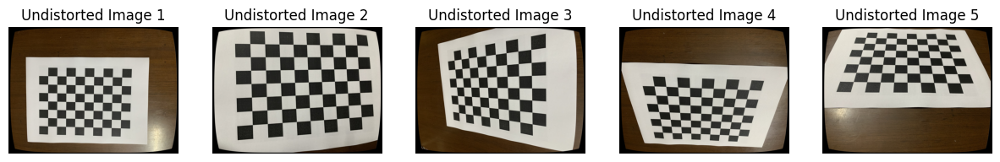

In [ ]:
import matplotlib.pyplot as plt
import cv2

print("\nRadial Distortion Coefficients:")
print(dist)

undistorted_folder = '/Users/brindamuralie/Desktop/Sem6/CV/assignmnent2/undistorted/'

for i in range(5):
    img = cv2.imread(images[i])
    undistorted_img = cv2.undistort(img, mtx, dist)
    cv2.imwrite(undistorted_folder + f"undistorted_{i}.jpg", undistorted_img)

fig, axes = plt.subplots(1, 5, figsize=(15, 5))

for i in range(5):
    undistorted_img = cv2.imread(undistorted_folder + f"undistorted_{i}.jpg")
    undistorted_img_rgb = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(undistorted_img_rgb)
    axes[i].axis('off')
    axes[i].set_title(f"Undistorted Image {i+1}")

plt.show()


part 4

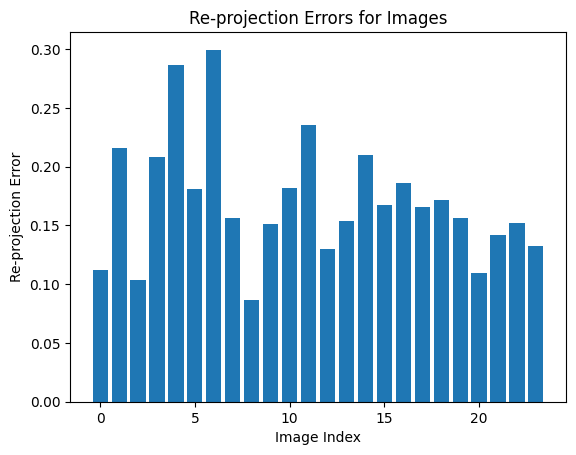


Mean Re-projection Error: 0.17060287062903998
Standard Deviation of Re-projection Error: 0.05151242757742144


In [ ]:
reproj_errors = []

for i in range(len(objpoints)):
    img_points_proj, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i], img_points_proj, cv2.NORM_L2) / len(img_points_proj)
    reproj_errors.append(error)

import matplotlib.pyplot as plt

plt.bar(range(len(reproj_errors)), reproj_errors)
plt.xlabel('Image Index')
plt.ylabel('Re-projection Error')
plt.title('Re-projection Errors for Images')
plt.show()

mean_error = np.mean(reproj_errors)
std_dev_error = np.std(reproj_errors)
print("\nMean Re-projection Error:", mean_error)
print("Standard Deviation of Re-projection Error:", std_dev_error)


part 5

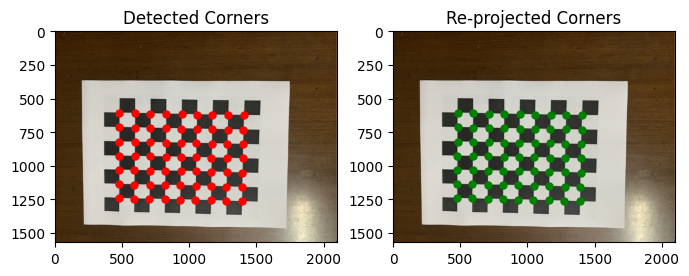

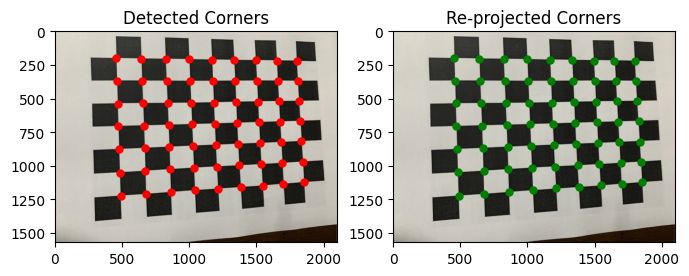

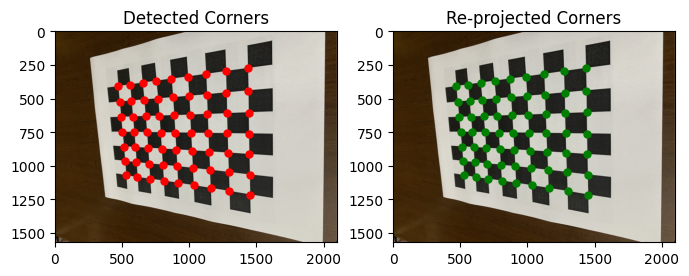

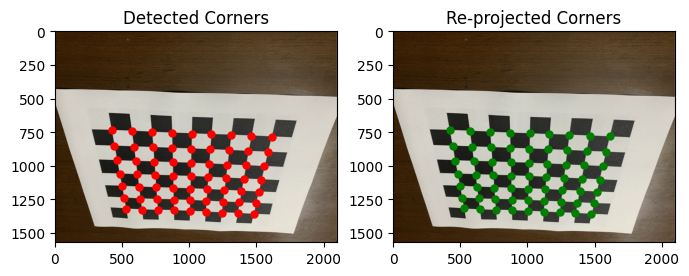

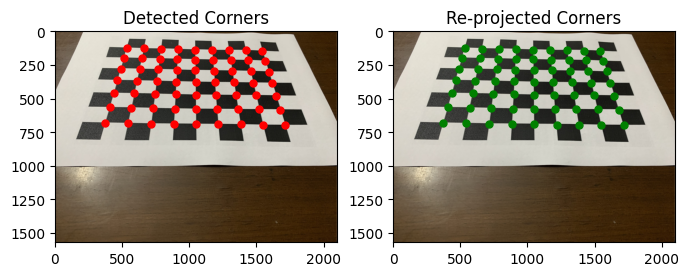

...

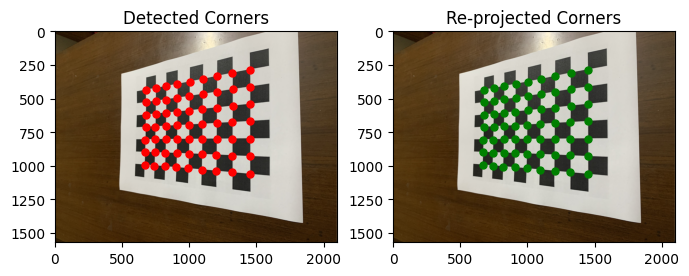

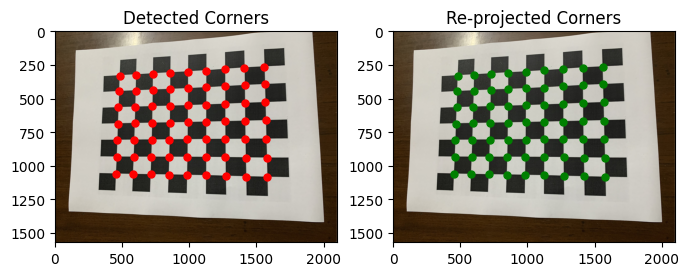

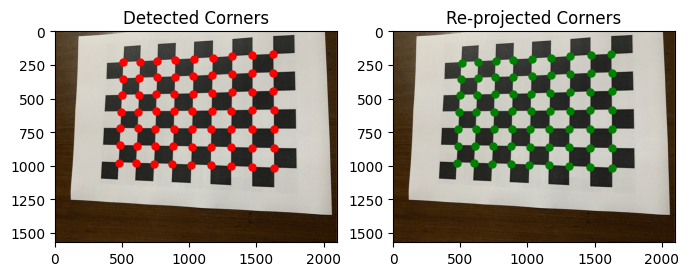

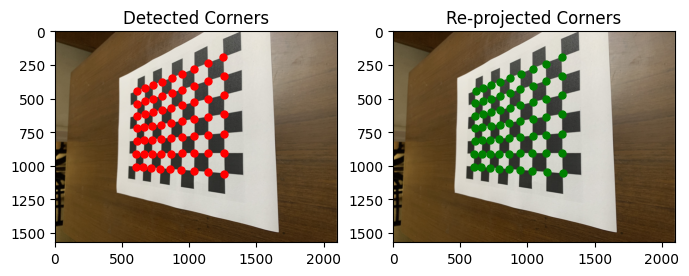

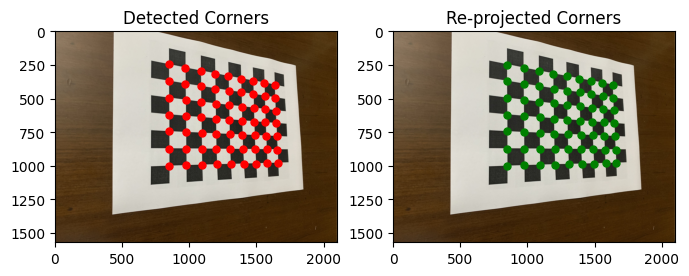

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def plot_corners_with_reprojection(img, corners, reprojected_corners):
    fig = plt.figure(figsize=(8, 6))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax0.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax0.plot(corners[:, 0, 0], corners[:, 0, 1], 'ro', markersize=5)
    ax0.set_title('Detected Corners')

    ax1 = plt.subplot(gs[1])
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.plot(reprojected_corners[:, 0, 0], reprojected_corners[:, 0, 1], 'go', markersize=5)
    ax1.set_title('Re-projected Corners')

    plt.show()

for i in range(len(images)):
    img = cv2.imread(images[i])
    corners = imgpoints[i].reshape(-1, 1, 2)
    reprojected_corners, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    reprojected_corners = reprojected_corners.reshape(-1, 1, 2)

    plot_corners_with_reprojection(img, corners, reprojected_corners)


part 6

In [ ]:
plane_normals = []

for i in range(len(rvecs)):
    rmat, _ = cv2.Rodrigues(rvecs[i])

    normal_world = np.array([[0], [0], [1]])
    normal_camera = np.dot(rmat, normal_world)
    plane_normals.append(normal_camera)

for i in range(len(plane_normals)):
    print(f"Image {i+1}: Checkerboard Plane Normal (in camera coordinate frame):")
    print(plane_normals[i])
    print()

Image 1: Checkerboard Plane Normal (in camera coordinate frame):
[[ 0.03054862]
 [-0.04059365]
 [ 0.99870863]]

Image 2: Checkerboard Plane Normal (in camera coordinate frame):
[[-0.14380555]
 [ 0.03642312]
 [ 0.98893545]]

Image 3: Checkerboard Plane Normal (in camera coordinate frame):
[[ 0.5104381 ]
 [-0.12141273]
 [ 0.85130012]]

Image 4: Checkerboard Plane Normal (in camera coordinate frame):
[[ 0.03344583]
 [-0.48299319]
 [ 0.87498512]]

Image 5: Checkerboard Plane Normal (in camera coordinate frame):
[[-0.02844649]
 [ 0.55919638]
 [ 0.82854705]]

Image 6: Checkerboard Plane Normal (in camera coordinate frame):
[[-0.34406586]
 [ 0.00589452]
 [ 0.93892701]]

Image 7: Checkerboard Plane Normal (in camera coordinate frame):
[[0.00183765]
 [0.51679364]
 [0.85610803]]

Image 8: Checkerboard Plane Normal (in camera coordinate frame):
[[-0.34739071]
 [ 0.04832101]
 [ 0.93647465]]

Image 9: Checkerboard Plane Normal (in camera coordinate frame):
[[-0.0467599 ]
 [ 0.06112513]
 [ 0.9970342